In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


def _norm_indiv(s):
    lo, hi = s.min(), s.max()
    return np.zeros_like(s) if hi - lo < 1e-8 else (s - lo) / (hi - lo)


def _zscore(s):
    mu, sigma = s.mean(), s.std()
    return (s - mu) / (sigma + 1e-8)


def _resample(s, n):
    return s[np.linspace(0, len(s) - 1, n, dtype=int)]


def _s2_cols(axis_order='XYZ'):
    """axis_order 문자열에 따라 samsung2 IMU 컬럼 순서 반환."""
    mapping = {'X': 'triceps_X', 'Y': 'triceps_Y', 'Z': 'triceps_Z'}
    return [mapping[a] for a in axis_order.upper()]


def _dtw_mv(xyz1, xyz2, n_pts=200):
    """다변량 DTW. 각 신호 독립 Z-score → n_pts 리샘플링 → (n_pts,3) DTW."""
    if any(len(x) < 20 for x in xyz1 + xyz2):
        return float('nan')
    a1 = np.stack([_resample(_zscore(s), n_pts) for s in xyz1], axis=1)
    a2 = np.stack([_resample(_zscore(r), n_pts) for r in xyz2], axis=1)
    D = np.full((n_pts + 1, n_pts + 1), np.inf); D[0, 0] = 0.0
    for i in range(1, n_pts + 1):
        for j in range(1, n_pts + 1):
            D[i, j] = np.sqrt(np.sum((a1[i-1] - a2[j-1]) ** 2)) + min(D[i-1,j], D[i,j-1], D[i-1,j-1])
    return float(D[n_pts, n_pts])


def _smooth(sig, window=15):
    if window <= 1 or len(sig) < window:
        return sig
    return np.convolve(sig, np.ones(window) / window, mode='same')


def _to_seconds(series):
    try:
        t = pd.to_datetime(series)
        return (t - t.iloc[0]).dt.total_seconds().values
    except Exception:
        t = series.astype(float).values
        span = t[-1] - t[0]
        return (t - t[0]) / 1000.0 if span > 100 else (t - t[0])


def _slice_seg(df, ex, rep_idx, time_col, duration_sec=8,
               start_frac=0.25, default_hz=500):
    seg = df[df['exercise'] == ex]
    if 'rep' in seg.columns and seg['rep'].notna().any():
        reps = sorted(seg['rep'].dropna().unique())
        seg  = seg[seg['rep'] == reps[min(rep_idx, len(reps)-1)]]
    else:
        seg = seg.iloc[:int(duration_sec * 2000)]
    seg  = seg.copy().reset_index(drop=True)
    skip = int(len(seg) * start_frac)
    seg  = seg.iloc[skip:].reset_index(drop=True)
    n_cut = int(duration_sec * default_hz)
    if time_col and time_col in seg.columns and len(seg) > 1:
        t_s    = _to_seconds(seg[time_col])
        span_s = t_s[-1]
        if span_s > 0:
            n_cut = int(duration_sec * len(seg) / span_s)
    return seg.iloc[:min(len(seg), max(n_cut, 1))].reset_index(drop=True)


def plot_imu_comparison(df1, df2, exercises=None, rep_idx=0,
                        duration_sec=8, start_frac=0.25,
                        smooth_window=15, figsize=(28, 6.5),
                        s2_axis_order='XYZ'):
    """
    Samsung1 vs Samsung2 IMU 파형 비교.
    s2_axis_order : Samsung2 축 순서 (예: 'XYZ', 'YXZ', 'ZYX' 등)
    """
    if exercises is None:
        common    = sorted(set(df1['exercise'].unique()) & set(df2['exercise'].unique()))
        exercises = common if common else sorted(df1['exercise'].unique())

    xyz_colors = ['steelblue', 'seagreen', 'tomato']
    xyz_labels = ['X', 'Y', 'Z']
    s2c = _s2_cols(s2_axis_order)
    col_titles = [
        'Samsung1  |  biceps (pos. 3)',
        'Samsung1  |  triceps (pos. 4)',
        f'Samsung2  |  triceps  [{s2_axis_order}]',
    ]

    n_rows = len(exercises)
    fig, axes = plt.subplots(n_rows, 3,
                             figsize=(figsize[0], figsize[1] * n_rows),
                             squeeze=False)

    for row, ex in enumerate(exercises):
        seg1 = _slice_seg(df1, ex, rep_idx, 'timestamp', duration_sec, start_frac)
        seg2 = _slice_seg(df2, ex, rep_idx, 'TimeStamp', duration_sec, start_frac)

        bic_raw = [seg1[f'biceps_{a}'].values  if f'biceps_{a}'  in seg1.columns else np.array([]) for a in 'XYZ']
        tri_raw = [seg1[f'triceps_{a}'].values if f'triceps_{a}' in seg1.columns else np.array([]) for a in 'XYZ']
        s2_raw  = [seg2[c].values if c in seg2.columns else np.array([]) for c in s2c]

        dtw_bic = _dtw_mv(bic_raw, s2_raw)
        dtw_tri = _dtw_mv(tri_raw, s2_raw)

        panels = [
            (bic_raw, f'DTW vs S2 = {dtw_bic:.3f}'),
            (tri_raw, f'DTW vs S2 = {dtw_tri:.3f}'),
            (s2_raw,  ''),
        ]

        for col, (signals, dtw_txt) in enumerate(panels):
            ax = axes[row, col]
            for sig, color, lbl in zip(signals, xyz_colors, xyz_labels):
                if len(sig) > 0:
                    ax.plot(_smooth(_norm_indiv(sig), smooth_window),
                            color=color, lw=1.2, alpha=0.9, label=lbl)
            title = f'{col_titles[col]}\n{dtw_txt}' if dtw_txt else col_titles[col]
            ax.set_title(title, fontsize=10)
            ax.set_ylim(-0.05, 1.05)
            ax.set_ylabel(ex if col == 0 else '',
                          fontsize=10, fontweight='bold', rotation=0, ha='right', labelpad=85)
            ax.tick_params(labelsize=8)
            ax.margins(x=0.01)
            if row == 0 and col == 0:
                ax.legend(fontsize=9, loc='upper right')

    fig.suptitle(
        f'IMU Comparison: Samsung1 (biceps / triceps) vs Samsung2 (triceps [{s2_axis_order}])  '
        f'|  rep_idx={rep_idx},  {duration_sec} s  (skip={int(start_frac*100)}%)',
        fontsize=14, y=1.01,
    )
    plt.tight_layout()
    plt.show()
    return fig


In [4]:
def compute_dtw_summary(df1, df2, exercises=None, duration_sec=8,
                        start_frac=0.25, max_reps=5, s2_axis_order='XYZ'):
    if exercises is None:
        common    = sorted(set(df1['exercise'].unique()) & set(df2['exercise'].unique()))
        exercises = common if common else sorted(df1['exercise'].unique())

    s2c  = _s2_cols(s2_axis_order)
    rows = []

    for ex in exercises:
        seg2   = _slice_seg(df2, ex, 0, 'TimeStamp', duration_sec, start_frac)
        s2_raw = [seg2[c].values if c in seg2.columns else np.array([]) for c in s2c]

        sub1 = df1[df1['exercise'] == ex]
        if 'rep' in sub1.columns and sub1['rep'].notna().any():
            reps = sorted(sub1['rep'].dropna().unique())[:max_reps]
        else:
            reps = [None]

        bic_list, tri_list = [], []
        for rep_i in range(len(reps)):
            seg1    = _slice_seg(df1, ex, rep_i, 'timestamp', duration_sec, start_frac)
            bic_raw = [seg1[f'biceps_{a}'].values  if f'biceps_{a}'  in seg1.columns else np.array([]) for a in 'XYZ']
            tri_raw = [seg1[f'triceps_{a}'].values if f'triceps_{a}' in seg1.columns else np.array([]) for a in 'XYZ']
            d_b = _dtw_mv(bic_raw, s2_raw)
            d_t = _dtw_mv(tri_raw, s2_raw)
            if not np.isnan(d_b): bic_list.append(d_b)
            if not np.isnan(d_t): tri_list.append(d_t)

        d_bic = float(np.mean(bic_list)) if bic_list else float('nan')
        d_tri = float(np.mean(tri_list)) if tri_list else float('nan')
        rows.append({'exercise': ex, 'DTW_biceps': d_bic,
                     'DTW_triceps': d_tri, 'DTW_mean': np.nanmean([d_bic, d_tri])})

    return pd.DataFrame(rows)


def plot_dtw_table(df1, df2, exercises=None, duration_sec=8,
                  start_frac=0.25, max_reps=5, s2_axis_order='XYZ'):
    df_s = compute_dtw_summary(df1, df2, exercises, duration_sec,
                               start_frac, max_reps, s2_axis_order)

    mean_row = pd.DataFrame([{
        'exercise'   : 'MEAN',
        'DTW_biceps' : df_s['DTW_biceps'].mean(),
        'DTW_triceps': df_s['DTW_triceps'].mean(),
        'DTW_mean'   : df_s['DTW_mean'].mean(),
    }])
    df_disp = pd.concat([df_s, mean_row], ignore_index=True)

    col_labels = ['Exercise',
                  'DTW biceps (vs S2)', 'DTW triceps (vs S2)', 'DTW mean']
    cell_text  = [[r['exercise'],
                   f"{r['DTW_biceps']:.3f}",
                   f"{r['DTW_triceps']:.3f}",
                   f"{r['DTW_mean']:.3f}"] for _, r in df_disp.iterrows()]

    n = len(df_disp)
    fig, ax = plt.subplots(figsize=(10, n * 0.52 + 1.5))
    ax.axis('off')

    tbl = ax.table(cellText=cell_text, colLabels=col_labels,
                   loc='center', cellLoc='center')
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(11)
    tbl.scale(1.3, 1.9)

    for j in range(4):
        tbl[0, j].set_facecolor('#2c3e50')
        tbl[0, j].set_text_props(color='white', fontweight='bold')
    for j in range(4):
        tbl[n, j].set_facecolor('#d4e6f1')
        tbl[n, j].set_text_props(fontweight='bold')
    for i, (_, row) in enumerate(df_s.iterrows(), start=1):
        b, t = row['DTW_biceps'], row['DTW_triceps']
        if not (np.isnan(b) or np.isnan(t)):
            tbl[i, 1].set_facecolor('#d5f5e3' if b < t else '#fdebd0')
            tbl[i, 2].set_facecolor('#d5f5e3' if t < b else '#fdebd0')

    ax.set_title(
        f'DTW Distance Summary: Samsung1 vs Samsung2  [S2 axis order: {s2_axis_order}]\n'
        f'(avg over ≤{max_reps} reps,  z-score norm,  {duration_sec}s)',
        fontsize=12, pad=14,
    )
    plt.tight_layout()
    plt.show()
    return df_s


In [5]:
from itertools import permutations as _perms

def compare_axis_permutations(df1, df2, exercises=None, duration_sec=8,
                               start_frac=0.25, max_reps=5):
    """6가지 축 순열 전체에 대해 DTW 평균을 계산하고 순위 표로 출력."""
    orders = [''.join(p) for p in _perms('XYZ')]

    records = []
    for order in orders:
        summary = compute_dtw_summary(df1, df2, exercises=exercises,
                                      duration_sec=duration_sec,
                                      start_frac=start_frac,
                                      max_reps=max_reps,
                                      s2_axis_order=order)
        records.append({
            'S2 axis order': order,
            'DTW biceps':    summary['DTW_biceps'].mean(),
            'DTW triceps':   summary['DTW_triceps'].mean(),
            'DTW mean':      summary['DTW_mean'].mean(),
        })

    df_res = pd.DataFrame(records).sort_values('DTW mean').reset_index(drop=True)
    best      = df_res.iloc[0]['S2 axis order']
    best_dtw  = df_res.iloc[0]['DTW mean']

    col_labels = ['S2 axis order', 'DTW biceps', 'DTW triceps', 'DTW mean']
    cell_text  = [[r['S2 axis order'],
                   f"{r['DTW biceps']:.4f}",
                   f"{r['DTW triceps']:.4f}",
                   f"{r['DTW mean']:.4f}"] for _, r in df_res.iterrows()]

    fig, ax = plt.subplots(figsize=(9, len(df_res) * 0.56 + 1.8))
    ax.axis('off')
    tbl = ax.table(cellText=cell_text, colLabels=col_labels,
                   loc='center', cellLoc='center')
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(11)
    tbl.scale(1.3, 1.9)
    for j in range(4):
        tbl[0, j].set_facecolor('#2c3e50')
        tbl[0, j].set_text_props(color='white', fontweight='bold')
    for j in range(4):
        tbl[1, j].set_facecolor('#a9dfbf')
        tbl[1, j].set_text_props(fontweight='bold')
    vals = df_res['DTW mean'].values
    vmin, vmax = vals.min(), vals.max()
    cmap = plt.cm.RdYlGn_r
    for i, v in enumerate(vals[1:], start=2):
        t = (v - vmin) / (vmax - vmin + 1e-9)
        r_c, g_c, b_c, _ = cmap(t)
        tbl[i, 3].set_facecolor((r_c, g_c, b_c, 0.35))
    ax.set_title(
        f'Axis Permutation Comparison  (sorted by DTW mean ↑ best)\n'
        f'Best order: S2 = {best}   |   z-score norm, {duration_sec}s',
        fontsize=12, pad=14,
    )
    plt.tight_layout()
    plt.show()
    print(f"\n★ Best axis order: S2 = {best}  (DTW mean = {best_dtw:.4f})")
    return df_res, best


In [6]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.linalg import orthogonal_procrustes

# ── 공통 유틸 ─────────────────────────────────────────────────────────────────

def _extract_mat(df, sensor, ex, rep_idx, time_col,
                 duration_sec=8, start_frac=0.25):
    """운동 구간 슬라이스 → (N, 3) raw float64 행렬."""
    seg  = _slice_seg(df, ex, rep_idx, time_col, duration_sec, start_frac)
    arrs = [seg[f'{sensor}_{a}'].values if f'{sensor}_{a}' in seg.columns
            else np.zeros(len(seg)) for a in 'XYZ']
    return np.stack(arrs, axis=1).astype(np.float64)


def _resample_mat(X, n):
    """(N, 3) → (n, 3) 균등 리샘플링."""
    return X[np.linspace(0, len(X) - 1, n, dtype=int)]


def _zscore_mat(X):
    """열별 독립 z-score 정규화."""
    return (X - X.mean(0)) / (X.std(0) + 1e-8)


def _dtw_raw(A, B, n_pts=200):
    """이미 정규화된 (N,3) 두 행렬의 multivariate DTW."""
    a, b = _resample_mat(A, n_pts), _resample_mat(B, n_pts)
    D = np.full((n_pts + 1, n_pts + 1), np.inf)
    D[0, 0] = 0.0
    for i in range(1, n_pts + 1):
        for j in range(1, n_pts + 1):
            D[i, j] = (np.linalg.norm(a[i-1] - b[j-1])
                       + min(D[i-1, j], D[i, j-1], D[i-1, j-1]))
    return float(D[n_pts, n_pts])


def _fix_signs(W, s1_z, s2_z, n_check=300):
    """
    PCA 부호 불확정성 보정.
    각 출력축 j에 대해 (S2@W)[:,j] 가 S1[:,j]와 음의 상관이면 열 flip.
    """
    n  = min(len(s1_z), len(s2_z), n_check)
    c1 = _resample_mat(s1_z, n)
    c2 = _resample_mat(s2_z @ W, n)
    W  = W.copy()
    for j in range(3):
        if np.corrcoef(c1[:, j], c2[:, j])[0, 1] < 0:
            W[:, j] *= -1
    return W


In [7]:
def level1_pca(s1_mat, s2_mat):
    """
    Level 1 — PCA 기반 축 정렬 (orthogonal, closed-form)
    ─────────────────────────────────────────────────────────────
    각 신호의 주성분(분산 방향)을 서로 맞추는 orthogonal 변환.
    V1, V2 = S1, S2 의 PCA 고유벡터 행렬 (행 = PC 방향)
    W = V2.T @ V1   →   S2_aligned = zscore(S2) @ W

    특성: 회전 + 반사(O(3)). 스케일/전단 없음.
    제약: DTW가 아닌 신호의 분산 방향 정렬 기준.
          PCA 부호 불확정성(±) 존재 → _fix_signs 로 보정.
    """
    s1_z = _zscore_mat(s1_mat)
    s2_z = _zscore_mat(s2_mat)

    V1 = PCA(n_components=3).fit(s1_z).components_   # (3, 3) rows = PCs
    V2 = PCA(n_components=3).fit(s2_z).components_   # (3, 3)

    W = V2.T @ V1                    # orthogonal (3, 3)
    W = _fix_signs(W, s1_z, s2_z)   # 부호 보정
    return W, s2_z @ W


In [8]:
def level2_procrustes(s1_mat, s2_mat, n_pts=500):
    """
    Level 2 — Orthogonal Procrustes (closed-form)
    ─────────────────────────────────────────────────────────────
    목적함수: argmin_{R ∈ O(3)}  || S1 - S2 @ R ||_F
    SVD 풀이: A = S2.T @ S1 = U Σ V.T  →  R = U V.T

    회전(SO(3)) + 반사(O(3)) 허용. 스케일/전단 없음.
    레벨 1(PCA: 분산 방향 기준)과 달리 두 신호의 직접 L2 거리 최소화.
    단, 목적함수가 L2 이므로 DTW 최소화는 보장 안 됨.
    """
    s1_z = _zscore_mat(s1_mat)
    s2_z = _zscore_mat(s2_mat)
    n    = min(len(s1_z), len(s2_z), n_pts)
    s1_r, s2_r = _resample_mat(s1_z, n), _resample_mat(s2_z, n)

    R, _ = orthogonal_procrustes(s2_r, s1_r)   # min ||s2@R - s1||_F
    return R, s2_z @ R


In [9]:
def level3_affine(s1_mat, s2_mat, n_pts=500):
    """
    Level 3 — Affine (일반 선형 변환, closed-form)
    ─────────────────────────────────────────────────────────────
    목적함수: argmin_W  || S1 - S2 @ W ||_F
    Closed-form: W = pinv(S2) @ S1  (최소제곱해)

    회전 + 반사 + 전단(shear) + 스케일 모두 허용.
    W 는 직교행렬 제약 없음 → 표현력 최대.
    물리적으로 불가능한 변환(전단 등)도 학습될 수 있음.
    레벨 2 대비 DTW가 반드시 낮아지지는 않음(DTW가 목적함수가 아님).
    """
    s1_z = _zscore_mat(s1_mat)
    s2_z = _zscore_mat(s2_mat)
    n    = min(len(s1_z), len(s2_z), n_pts)
    s1_r, s2_r = _resample_mat(s1_z, n), _resample_mat(s2_z, n)

    W, _, _, _ = np.linalg.lstsq(s2_r, s1_r, rcond=None)   # (3, 3)
    return W, s2_z @ W


In [10]:
import torch
import torch.nn as nn

def _soft_dtw_torch(X, Y, gamma=0.1):
    """
    Differentiable Soft-DTW.  X, Y : (T, d) float tensors.
    log-sum-exp trick → numerically stable softmin.
    """
    T    = X.shape[0]
    diff = X.unsqueeze(1) - Y.unsqueeze(0)           # (T, T, d)
    D    = torch.sqrt((diff ** 2).sum(-1) + 1e-8)    # (T, T)

    R = torch.full((T + 1, T + 1), float('inf'),
                   dtype=X.dtype, device=X.device)
    R[0, 0] = 0.0
    for i in range(1, T + 1):
        for j in range(1, T + 1):
            r      = torch.stack([R[i-1, j-1], R[i-1, j], R[i, j-1]])
            R[i,j] = D[i-1, j-1] - gamma * torch.logsumexp(-r / gamma, 0)
    return R[T, T]


def level4_softdtw(s1_mat, s2_mat, n_pts=100, epochs=200,
                   lr=5e-3, gamma=0.5, verbose=True):
    """
    Level 4 — Soft-DTW Gradient Descent
    ─────────────────────────────────────────────────────────────
    목적함수: argmin_W  soft-DTW( S1, S2 @ W )
    W ∈ GL(3) (unconstrained, I로 초기화), Adam optimizer.

    레벨 3과 달리 L2 거리가 아닌 DTW 자체를 loss로 사용 →
    시간 warping 비용까지 고려한 가장 직접적인 최적화.
    단점: local minimum 위험, 수렴 보장 없음, 속도 느림.
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    s1_z   = _zscore_mat(s1_mat)
    s2_z   = _zscore_mat(s2_mat)
    n      = min(len(s1_z), len(s2_z), n_pts)

    s1_t = torch.tensor(_resample_mat(s1_z, n), dtype=torch.float32, device=device)
    s2_t = torch.tensor(_resample_mat(s2_z, n), dtype=torch.float32, device=device)

    W   = nn.Parameter(torch.eye(3, device=device))
    opt = torch.optim.Adam([W], lr=lr)

    for ep in range(1, epochs + 1):
        opt.zero_grad()
        loss = _soft_dtw_torch(s1_t, s2_t @ W, gamma)
        loss.backward()
        opt.step()
        if verbose and ep % 50 == 0:
            print(f"    ep {ep:>3}/{epochs}  soft-DTW = {loss.item():.4f}")

    W_np = W.detach().cpu().numpy()
    return W_np, s2_z @ W_np


In [11]:
def plot_pca_alignment(df1, df2, exercises=None, rep_idx=0,
                       duration_sec=8, start_frac=0.25,
                       smooth_window=10, figsize=(22, 3.5)):
    """
    PCA 정렬 시각화 (운동별).
    각 운동: [W 행렬] | [S1 triceps] | [S2 원본] | [S2 PCA 정렬 후]

    W 행렬 읽는 법:
      행 = S1 축 방향, 열 = S2 축 입력
      W[i,j] = S2의 j축이 S1의 i축에 기여하는 가중치
      → 순열 행렬에 가까우면 단순 축 교환, 대각선 외 큰 값이면 기울어진 관계
    """
    if exercises is None:
        exercises = sorted(set(df1['exercise'].unique()) & set(df2['exercise'].unique()))

    xyz_c = ['steelblue', 'seagreen', 'tomato']
    xyz_l = ['X', 'Y', 'Z']

    for ex in exercises:
        s1_mat = _extract_mat(df1, 'triceps', ex, rep_idx, 'timestamp',  duration_sec, start_frac)
        s2_mat = _extract_mat(df2, 'triceps', ex, 0,       'TimeStamp',  duration_sec, start_frac)
        if min(len(s1_mat), len(s2_mat)) < 20:
            continue

        W, s2_aligned = level1_pca(s1_mat, s2_mat)
        s1_z  = _zscore_mat(s1_mat)
        s2_z  = _zscore_mat(s2_mat)
        dtw_b = _dtw_raw(s1_z, s2_z)
        dtw_a = _dtw_raw(s1_z, s2_aligned)
        improved = dtw_a < dtw_b

        fig, axes = plt.subplots(1, 4, figsize=figsize)

        # ─ W 행렬 히트맵 ──────────────────────────────────────────────────────
        ax = axes[0]
        im = ax.imshow(W, cmap='RdBu_r', vmin=-1.5, vmax=1.5, aspect='equal')
        ax.set_xticks([0, 1, 2])
        ax.set_xticklabels(['S2-X', 'S2-Y', 'S2-Z'], fontsize=8)
        ax.set_yticks([0, 1, 2])
        ax.set_yticklabels(['S1-X', 'S1-Y', 'S1-Z'], fontsize=8)
        for i in range(3):
            for j in range(3):
                v = W[i, j]
                ax.text(j, i, f'{v:.2f}', ha='center', va='center',
                        fontsize=10, fontweight='bold',
                        color='white' if abs(v) > 0.7 else 'black')
        plt.colorbar(im, ax=ax, shrink=0.8, label='weight')
        det = np.linalg.det(W)
        ax.set_title(f'W matrix  (det={det:.2f})\n'
                     f'{"rotation" if det > 0 else "rotation+reflection"}',
                     fontsize=9)

        # ─ 신호 패널 ──────────────────────────────────────────────────────────
        delta_str = f'Δ {dtw_a - dtw_b:+.1f}'
        panels = [
            (s1_z,       'S1 triceps\n(reference)',                        'black'),
            (s2_z,       f'S2 original\nDTW = {dtw_b:.1f}',               'black'),
            (s2_aligned, f'S2 PCA-aligned\nDTW = {dtw_a:.1f}  ({delta_str})',
             'seagreen' if improved else 'tomato'),
        ]
        for col, (mat, title, title_c) in enumerate(panels, start=1):
            ax = axes[col]
            x  = np.linspace(0, duration_sec * (1 - start_frac), len(mat))
            for k in range(3):
                ax.plot(x, _smooth(mat[:, k], smooth_window),
                        color=xyz_c[k], lw=1.2, alpha=0.9, label=xyz_l[k])
            ax.set_title(title, fontsize=9, color=title_c)
            ax.set_ylim(-3.5, 3.5)
            ax.set_xlabel('time (s)', fontsize=8)
            ax.tick_params(labelsize=7)
            ax.margins(x=0.01)
            if col == 1:
                ax.legend(fontsize=8, loc='upper right')

        fig.suptitle(f'PCA Alignment  |  {ex}  (rep={rep_idx})',
                     fontsize=12, y=1.02)
        plt.tight_layout()
        plt.show()


def plot_axis_correlation(df1, df2, exercises=None, rep_idx=0,
                          duration_sec=8, start_frac=0.25, n_pts=300):
    """
    S1-S2 축 간 Pearson 상관계수 행렬, 전체 운동 평균.
    Before vs After PCA alignment 비교.
    → 어떤 축이 어떤 축과 원래 상관됐는지, 정렬 후 대각선이 강해지는지 확인.
    """
    if exercises is None:
        exercises = sorted(set(df1['exercise'].unique()) & set(df2['exercise'].unique()))

    corr_b = np.zeros((3, 3))
    corr_a = np.zeros((3, 3))
    count  = 0

    for ex in exercises:
        s1_mat = _extract_mat(df1, 'triceps', ex, rep_idx, 'timestamp',  duration_sec, start_frac)
        s2_mat = _extract_mat(df2, 'triceps', ex, 0,       'TimeStamp',  duration_sec, start_frac)
        if min(len(s1_mat), len(s2_mat)) < 20:
            continue

        W, s2_aligned = level1_pca(s1_mat, s2_mat)
        s1_z = _zscore_mat(s1_mat)
        s2_z = _zscore_mat(s2_mat)
        n    = min(len(s1_z), len(s2_z), n_pts)
        a1   = _resample_mat(s1_z,      n)
        b0   = _resample_mat(s2_z,      n)
        b1   = _resample_mat(s2_aligned, n)

        for i in range(3):
            for j in range(3):
                corr_b[i, j] += np.corrcoef(a1[:, i], b0[:, j])[0, 1]
                corr_a[i, j] += np.corrcoef(a1[:, i], b1[:, j])[0, 1]
        count += 1

    if count == 0:
        return
    corr_b /= count
    corr_a /= count

    # 대각선 평균 상관 (이상적이면 1.0)
    diag_b = np.diag(corr_b).mean()
    diag_a = np.diag(corr_a).mean()

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    lbl = ['X', 'Y', 'Z']
    for ax, mat, title in zip(axes,
                               [corr_b, corr_a],
                               [f'Before PCA  (diag avg={diag_b:.2f})',
                                f'After PCA   (diag avg={diag_a:.2f})']):
        im = ax.imshow(mat, cmap='RdBu_r', vmin=-1, vmax=1, aspect='equal')
        ax.set_xticks([0, 1, 2]); ax.set_xticklabels([f'S2-{l}' for l in lbl])
        ax.set_yticks([0, 1, 2]); ax.set_yticklabels([f'S1-{l}' for l in lbl])
        for i in range(3):
            for j in range(3):
                v = mat[i, j]
                ax.text(j, i, f'{v:.2f}', ha='center', va='center',
                        fontsize=12, fontweight='bold',
                        color='white' if abs(v) > 0.5 else 'black')
        # 대각선 강조
        for k in range(3):
            ax.add_patch(plt.Rectangle((k - 0.5, k - 0.5), 1, 1,
                                       fill=False, edgecolor='gold',
                                       linewidth=2.5))
        plt.colorbar(im, ax=ax, shrink=0.8, label='Pearson r')
        ax.set_title(title, fontsize=11)

    fig.suptitle(
        f'Axis Correlation: S1 triceps ↔ S2 triceps  '
        f'(avg {count} exercises)\n'
        f'대각선(금테)이 강해질수록 축이 잘 정렬됨',
        fontsize=12
    )
    plt.tight_layout()
    plt.show()


In [2]:
import pandas as pd

s1 = pd.read_parquet('../data/samsung1.parquet')
s2 = pd.read_parquet('../data/samsung2_original.parquet')

print("── Samsung1 ──────────────────────────────────────")
print(f"  shape    : {s1.shape}")
print(f"  columns  : {s1.columns.tolist()}")
print(f"  exercises: {sorted(s1['exercise'].unique())}")

print("\n── Samsung2 ──────────────────────────────────────")
print(f"  shape    : {s2.shape}")
print(f"  columns  : {s2.columns.tolist()}")
print(f"  exercises: {sorted(s2['exercise'].unique())}")

print("\n── 공통 운동 ────────────────────────────────────")
common = sorted(set(s1['exercise'].unique()) & set(s2['exercise'].unique()))
print(f"  {common}")


── Samsung1 ──────────────────────────────────────
  shape    : (16148132, 13)
  columns  : ['timestamp', 'absolute_time', 'filename', 'subject', 'exercise', 'biceps', 'triceps', 'biceps_X', 'biceps_Y', 'biceps_Z', 'triceps_X', 'triceps_Y', 'triceps_Z']
  exercises: ['barbellcurl', 'barbellrow', 'benchpress', 'bte', 'deadlift', 'dips', 'latpulldown', 'ohp', 'pullup', 'pushup']

── Samsung2 ──────────────────────────────────────
  shape    : (26224560, 12)
  columns  : ['TimeStamp', 'Index_Time', 'Save_Time', 'beep', 'csv_filename_l', 'subject_id', 'exercise', 'biceps', 'triceps', 'triceps_X', 'triceps_Y', 'triceps_Z']
  exercises: ['barbellcurl', 'barbellrow', 'benchpress', 'bte', 'deadlift', 'dips', 'latpulldown', 'ohp', 'pullup', 'pushup']

── 공통 운동 ────────────────────────────────────
  ['barbellcurl', 'barbellrow', 'benchpress', 'bte', 'deadlift', 'dips', 'latpulldown', 'ohp', 'pullup', 'pushup']


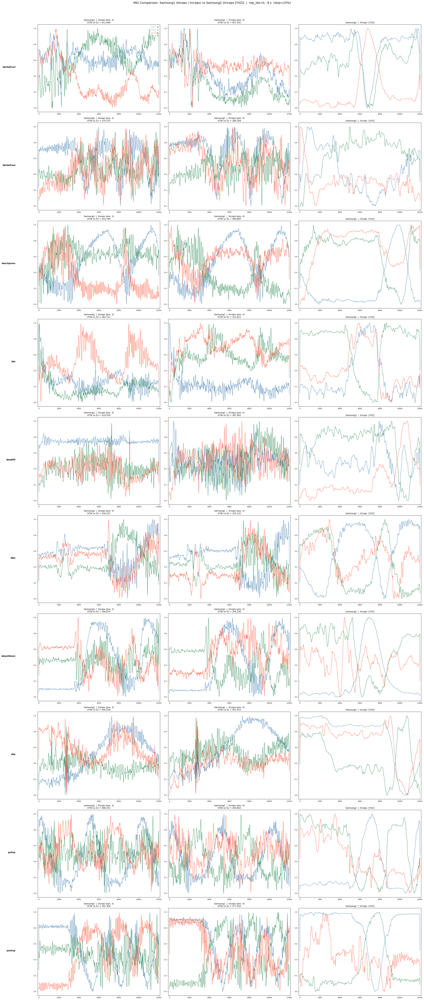

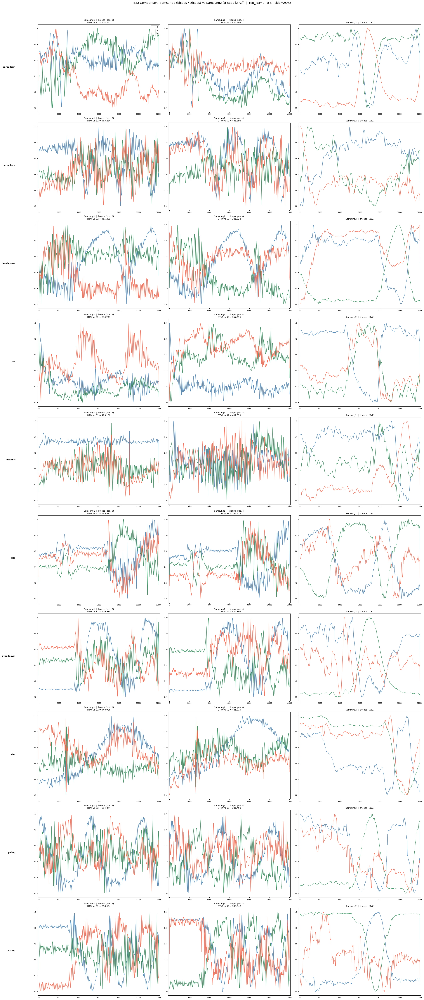

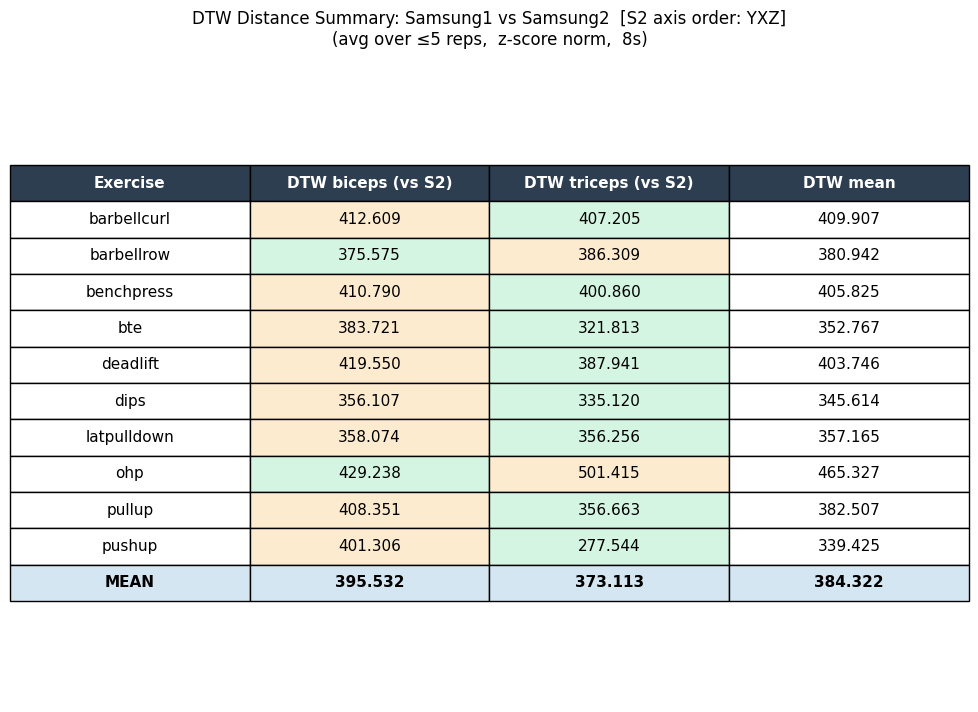

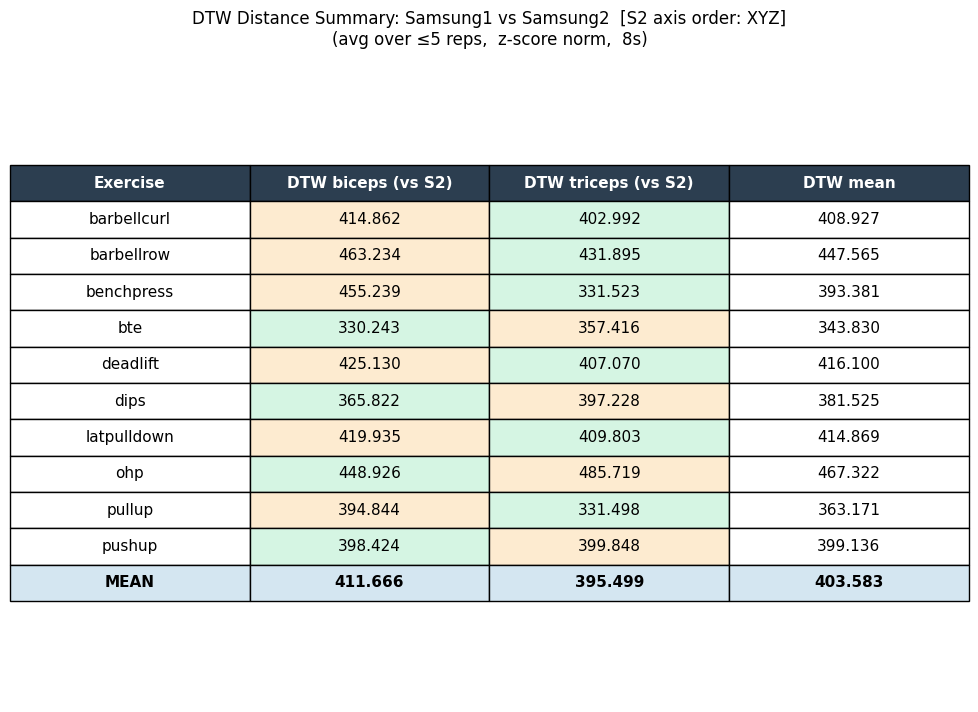

In [77]:
# ── 파형 시각화 ───────────────────────────────────────────────────────────────
fig = plot_imu_comparison(s1, s2, rep_idx=0, s2_axis_order='YXZ')
fig = plot_imu_comparison(s1, s2, rep_idx=0, s2_axis_order='XYZ')
# ── DTW 요약 표 ───────────────────────────────────────────────────────────────
df_dtw = plot_dtw_table(s1, s2, s2_axis_order='YXZ')

df_dtw = plot_dtw_table(s1, s2, s2_axis_order='XYZ')

In [13]:
import time

# ── 설정 ─────────────────────────────────────────────────────────────────────
EX_LIST    = sorted(set(s1['exercise'].unique()) & set(s2['exercise'].unique()))
DURATION   = 8
START_FRAC = 0.25
N_REPS     = 3      # S1 평균 rep 수 (S2는 rep 없으므로 항상 rep_idx=0)
N_PTS      = 200    # DTW 비교 포인트 수

LEVELS = {
    'L1  PCA':        level1_pca,
    # 'L2  Procrustes': level2_procrustes,
    # 'L3  Affine':     level3_affine,
    # 'L4  SoftDTW':    lambda s1m, s2m: level4_softdtw(s1m, s2m, verbose=False),
}

# ── 계산 ─────────────────────────────────────────────────────────────────────
baseline_vals = []                          # 변환 전 DTW (모든 레벨 공통)
after_vals    = {k: [] for k in LEVELS}    # 변환 후 DTW

for ex in EX_LIST:
    s2_mat = _extract_mat(s2, 'triceps', ex, 0, 'TimeStamp', DURATION, START_FRAC)
    print(f"[{ex}]", end=' ', flush=True)

    for rep_i in range(N_REPS):
        s1_mat = _extract_mat(s1, 'triceps', ex, rep_i, 'timestamp', DURATION, START_FRAC)
        if min(len(s1_mat), len(s2_mat)) < 20:
            continue

        s1_z = _zscore_mat(s1_mat)
        s2_z = _zscore_mat(s2_mat)
        baseline_vals.append(_dtw_raw(s1_z, s2_z, N_PTS))

        t0 = time.time()
        for name, fn in LEVELS.items():
            try:
                W, s2_aligned = fn(s1_mat, s2_mat)
                after_vals[name].append(_dtw_raw(s1_z, s2_aligned, N_PTS))
            except Exception as e:
                print(f"\n  [{name}] {ex} rep{rep_i}: {e}")
        print(f"rep{rep_i}({time.time()-t0:.1f}s)", end=' ', flush=True)
    print()

# ── 결과 출력 ─────────────────────────────────────────────────────────────────
d_base = np.mean(baseline_vals)
print()
print("=" * 62)
print(f"  Axis Alignment DTW Summary")
print(f"  ({N_REPS} reps × {len(EX_LIST)} exercises, n_pts={N_PTS})")
print("=" * 62)
print(f"  {'Method':<18} {'Before':>9} {'After':>9} {'Δ DTW':>9} {'Impr%':>8}")
print("  " + "─" * 58)
print(f"  {'Baseline (no transform)':<18} {d_base:>9.3f}")
for name, vals in after_vals.items():
    if vals:
        a   = np.mean(vals)
        d   = d_base - a
        pct = d / d_base * 100
        bar = '▲' if d > 0 else '▼'
        print(f"  {name:<18} {d_base:>9.3f} {a:>9.3f} {d:>9.3f}  {bar}{abs(pct):>6.1f}%")
print("=" * 62)


[barbellcurl] rep0(0.1s) rep1(0.1s) rep2(0.1s) 
[barbellrow] rep0(0.1s) rep1(0.1s) rep2(0.1s) 
[benchpress] rep0(0.1s) rep1(0.1s) rep2(0.1s) 
[bte] rep0(0.1s) rep1(0.1s) rep2(0.1s) 
[deadlift] rep0(0.1s) rep1(0.1s) rep2(0.1s) 
[dips] rep0(0.1s) rep1(0.1s) rep2(0.1s) 
[latpulldown] rep0(0.1s) rep1(0.1s) rep2(0.1s) 
[ohp] rep0(0.1s) rep1(0.1s) rep2(0.1s) 
[pullup] rep0(0.1s) rep1(0.1s) rep2(0.1s) 
[pushup] rep0(0.1s) rep1(0.1s) rep2(0.1s) 

  Axis Alignment DTW Summary
  (3 reps × 10 exercises, n_pts=200)
  Method                Before     After     Δ DTW    Impr%
  ──────────────────────────────────────────────────────────
  Baseline (no transform)   395.499
  L1  PCA              395.499   329.975    65.524  ▲  16.6%


In [ ]:
# ── 운동별 PCA 정렬: W 행렬 + 신호 비교 ─────────────────────────────────────
plot_pca_alignment(s1, s2, rep_idx=0)

# ── 전체 운동 평균 축 상관계수: Before vs After PCA ──────────────────────────
plot_axis_correlation(s1, s2)
